# Machine Learning

### Placeholder

In [1]:
import numpy as np
import pandas as pd
import ydata_profiling as profiling
import scipy

import tqdm

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

from jupyterthemes import jtplot
jtplot.style(theme='onedork')

plt.rcParams["figure.figsize"] = [18, 13]
plt.rcParams["text.usetex"] = False

%matplotlib inline
%config Completer.use_jedi = False

print("Imports Done!")

Imports Done!


In [5]:
class Config:
    random_seed = 13
    train_size = 0.75

print(Config.random_seed)
print(Config.train_size)

13
0.75


### California Housing

In [31]:
from sklearn.datasets import fetch_california_housing


housing = fetch_california_housing(as_frame=True)
df = pd.concat([pd.DataFrame(housing["data"]), pd.DataFrame(housing["target"])], axis=1)
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


In [32]:
profile = profiling.ProfileReport(df, title="Pandas Profiling Report")

In [33]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [34]:
X = df.drop("MedHouseVal", axis=1)
y = df["MedHouseVal"]

In [108]:
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=13)

In [109]:
from sklearn.linear_model import LinearRegression


model = LinearRegression()

model.fit(X_train, y_train)

LinearRegression()

In [110]:
prediction = model.predict(X_test)

In [111]:
from sklearn.metrics import mean_squared_error


mean_squared_error(y_test, prediction)

0.5282451907311089

In [114]:
mean_squared_error(y_test, prediction)**0.5

0.7268047817200358

In [117]:
from sklearn.model_selection import KFold

n_splits = 10
models = []
errors = []

# параметры валидации, обучение будет идти на n_splits (фолдах)
kf = KFold(n_splits=n_splits, shuffle=True, random_state=13)
for num, (train_index, test_index) in enumerate(kf.split(X)):

    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    model = LinearRegression()

    models.append(model)  # Сохраняем модель для дальнейшего использования

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    error = mean_squared_error(y_test, y_pred)
    errors.append(error)
    print(f"fold: {num + 1} acc: {error}")

assert len(clfs) == n_splits  # Проверка, что все ок

# Считаем среднее и дисперсию по всем фолдам
print("mean accuracy score --", np.mean(errors, dtype="float16"), np.std(errors).round(4))

fold: 1 acc: 0.5537420654727395
fold: 2 acc: 0.5115063787869688
fold: 3 acc: 0.5407528329043558
fold: 4 acc: 0.5290047785051862
fold: 5 acc: 0.4658885956709743
fold: 6 acc: 0.5236911108540495
fold: 7 acc: 0.5190215540310231
fold: 8 acc: 0.5170417876097574
fold: 9 acc: 0.5113209410846496
fold: 10 acc: 0.5957956277829223
mean accuracy score -- 0.5264 0.0317


### Diamonds

In [7]:
data = pd.read_csv('https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/diamonds.csv', index_col=0)
data.head(5)

,carat,cut,color,clarity,depth,table,price,x,y,z
1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 53940 entries, 1 to 53940
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    53940 non-null  float64
 1   cut      53940 non-null  object 
 2   color    53940 non-null  object 
 3   clarity  53940 non-null  object 
 4   depth    53940 non-null  float64
 5   table    53940 non-null  float64
 6   price    53940 non-null  int64  
 7   x        53940 non-null  float64
 8   y        53940 non-null  float64
 9   z        53940 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 6.5+ MB


In [12]:
data.describe()

,carat,depth,table,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


In [8]:
profile = profiling.ProfileReport(data, title="Pandas Profiling Report - Diamonds dataset")

In [9]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<Axes: >

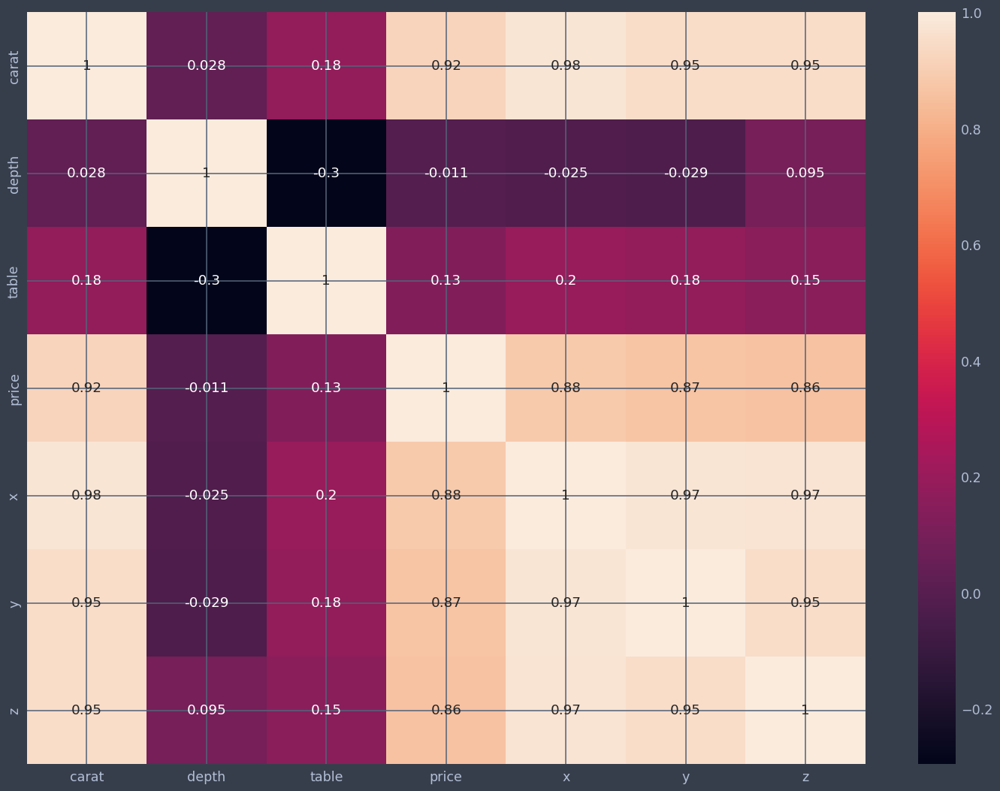

In [15]:
sns.heatmap(data.corr(numeric_only=True), annot=True)

## Gradient Descent

In [51]:
def function(x):
    return x**4 - 10*x + 3

In [52]:
x_values = [x for x in np.arange(-4, 4, 0.1)]
f_values = [function(x) for x in np.arange(-4, 4, 0.1)]

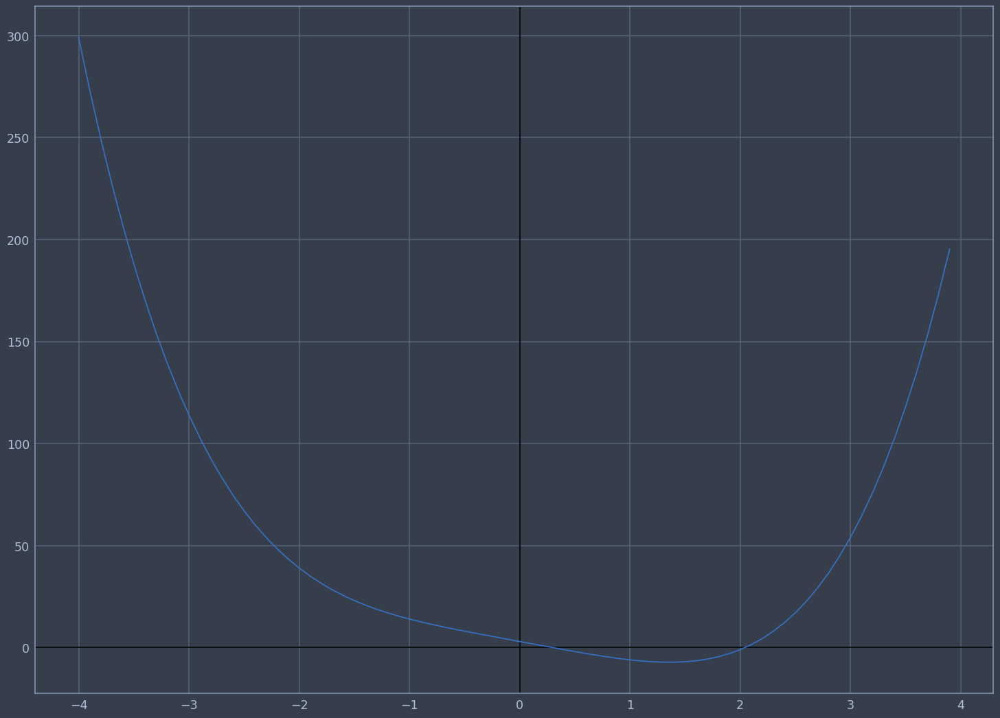

In [53]:
plt.axvline(x=0, c="black")
plt.axhline(y=0, c="black")
plt.plot(x_values, f_values)

In [54]:
def gradient_of_function(x):
    return 4*x**3 - 10

def gradient_descent(x_start, learning_rate, epsilon, num_iterations):
    x_current = x_start

    for x in range(num_iterations):
        x_new = x_current - learning_rate * gradient_of_function(x_current)

        if abs(x_new - x_current) < epsilon:
            return x_current

        x_current = x_new

    return x_current

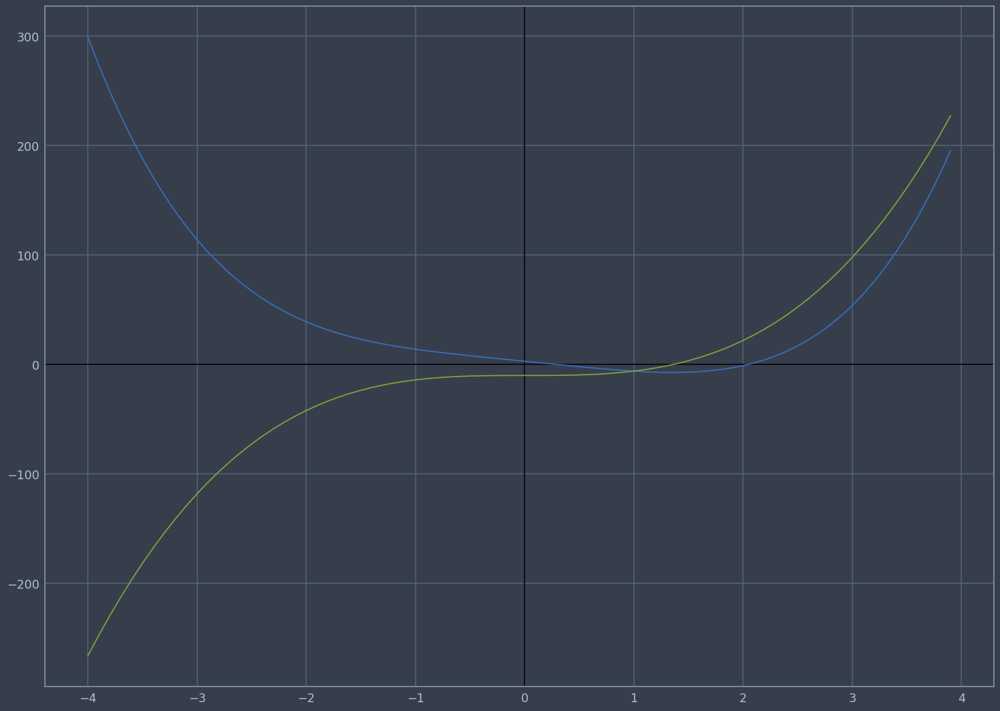

In [55]:
plt.axvline(x=0, c="black")
plt.axhline(y=0, c="black")
plt.plot(x_values, f_values, x_values, [gradient_of_function(x) for x in np.arange(-4, 4, 0.1)])

In [57]:
result = gradient_descent(5, 0.01, 0.001, 10**5)
result

1.3536689167657399

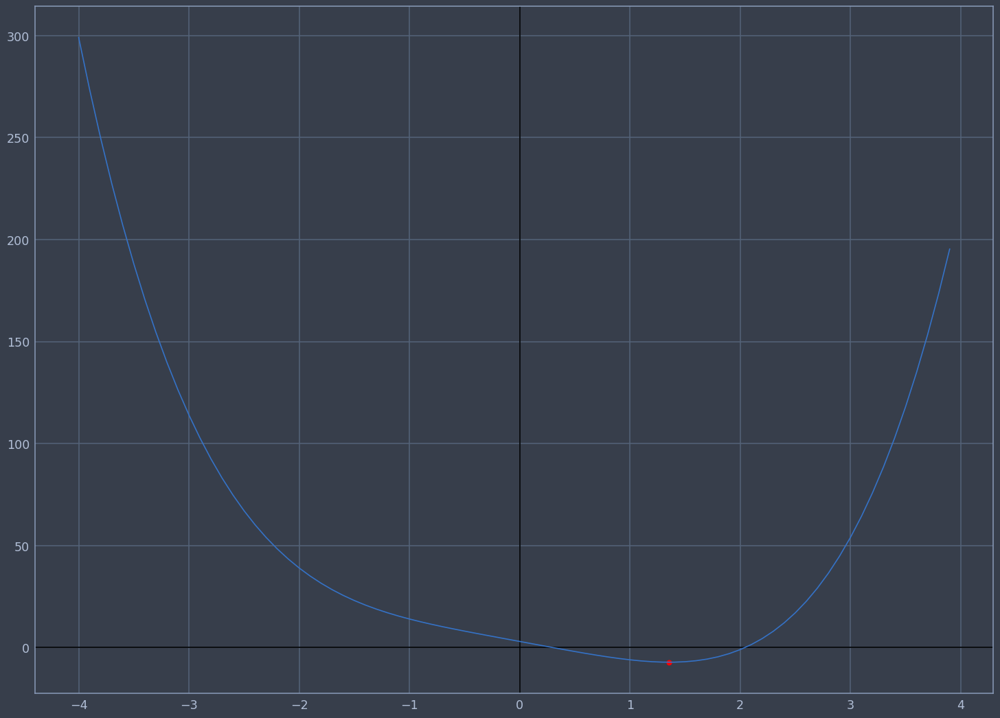

In [58]:
plt.axvline(x=0, c="black")
plt.axhline(y=0, c="black")
plt.plot(x_values, f_values)
plt.scatter(result, function(result), marker="o", c="red")

In [60]:
result_grad_minimize = scipy.optimize.minimize(function, 5, method="BFGS")

print(result_grad_minimize, end="\n\n")
print(f"Result = {result_grad_minimize.x}")

  message: Optimization terminated successfully.
  success: True
   status: 0
      fun: -7.179066062230898
        x: [ 1.357e+00]
      nit: 10
      jac: [ 0.000e+00]
 hess_inv: [[ 4.523e-02]]
     nfev: 22
     njev: 11

Result = [1.3572088]


In [63]:
1 - 0.01 * (2/3 * (10 * (3 + 10 + 40 - 100) + 5 * (3 + 5 + 36 - 73) + 7 * (3 + 7 + 30 - 71)))

6.546666666666666